In [1]:
import pandas as pd, numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [2]:
# read data
df = pd.read_csv('C:/Users/Dell/Downloads/train (1).csv')
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,_,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [3]:
df.shape

(100000, 28)

# Handling Missing value and Data Cleaning

In [4]:
df.isnull().sum()*100/df.shape[0]

ID                           0.000
Customer_ID                  0.000
Month                        0.000
Name                         9.985
Age                          0.000
SSN                          0.000
Occupation                   0.000
Annual_Income                0.000
Monthly_Inhand_Salary       15.002
Num_Bank_Accounts            0.000
Num_Credit_Card              0.000
Interest_Rate                0.000
Num_of_Loan                  0.000
Type_of_Loan                11.408
Delay_from_due_date          0.000
Num_of_Delayed_Payment       7.002
Changed_Credit_Limit         0.000
Num_Credit_Inquiries         1.965
Credit_Mix                   0.000
Outstanding_Debt             0.000
Credit_Utilization_Ratio     0.000
Credit_History_Age           9.030
Payment_of_Min_Amount        0.000
Total_EMI_per_month          0.000
Amount_invested_monthly      4.479
Payment_Behaviour            0.000
Monthly_Balance              1.200
Credit_Score                 0.000
dtype: float64

In [5]:
df[df['Name'].isnull()].head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
7,0x1609,CUS_0xd40,August,NaN,23,#F%$D@*&8,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,6,11.27,4.0,Good,809.98,23.933795,NaN,No,49.574949,24.785216509052056,High_spent_Medium_value_payments,358.12416760938714,Standard
17,0x161b,CUS_0x2dbc,February,NaN,34,486-85-3974,Engineer,143162.64,12187.220000,1,5,8,3,"Auto Loan, Auto Loan, and Not Specified",13,6,7.1,3.0,Good,1303.01,41.702573,17 Years and 10 Months,No,246.992319,232.86038375993544,High_spent_Small_value_payments,998.8692967863226,Good
22,0x1620,CUS_0x2dbc,July,NaN,34,486-85-3974,Engineer,143162.64,12187.220000,1,5,8,3,"Auto Loan, Auto Loan, and Not Specified",8,6,7.1,3.0,Good,1303.01,38.068624,18 Years and 3 Months,No,246.992319,263.17416316163934,High_spent_Small_value_payments,968.5555173846187,Standard
64,0x1662,CUS_0x4157,January,NaN,23,070-19-1622,Doctor,114838.41,9843.867500,2,5,7,-100,"Personal Loan, Debt Consolidation Loan, and Au...",13,11,8.24,3.0,Good,1377.74,33.664554,21 Years and 4 Months,No,226.892792,215.19351594560425,High_spent_Small_value_payments,802.3004421328528,Good
80,0x167a,CUS_0xa66b,January,NaN,40,221-30-8554,Teacher,33751.27,2948.605833,5,5,20,3_,"Credit-Builder Loan, Personal Loan, and Auto Loan",16,20,11.0,4.0,Standard,1328.93,37.089076,19 Years and 2 Months,NM,65.008174,117.30669710658556,High_spent_Medium_value_payments,362.54571194023237,Standard


In [6]:
# drop Name 
df = df.drop('Name',axis=1)

In [7]:
df.shape

(100000, 27)

In [8]:
df['Monthly_Inhand_Salary'].describe()

count    84998.000000
mean      4194.170850
std       3183.686167
min        303.645417
25%       1625.568229
50%       3093.745000
75%       5957.448333
max      15204.633333
Name: Monthly_Inhand_Salary, dtype: float64

In [9]:
median=df['Monthly_Inhand_Salary'].median()

In [10]:
# fill with median
df['Monthly_Inhand_Salary'].fillna(value=median,inplace=True)

In [11]:
df['Monthly_Inhand_Salary'].isnull().sum()

0

In [12]:
df[df['Type_of_Loan'].isnull()].head()

,ID,Customer_ID,Month,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
32,0x1632,CUS_0x1cdb,January,21,615-06-7821,Developer,35547.71_,2853.309167,7,5,5,0,NaN,5,NaN,2.58,4.0,Standard,943.86,39.797764,30 Years and 8 Months,Yes,0.0,276.72539431736266,!@9#%8,288.60552234930395,Standard
33,0x1633,CUS_0x1cdb,February,21,615-06-7821,Developer,35547.71,3093.745000,7,5,5,0,NaN,9,NaN,2.58,4.0,Standard,943.86,27.020360,30 Years and 9 Months,NM,0.0,74.44364104999623,High_spent_Medium_value_payments,460.88727561667037,Standard
34,0x1634,CUS_0x1cdb,March,21,615-06-7821,Developer,35547.71,2853.309167,7,5,5,-100,NaN,5,12,2.58,4.0,Standard,943.86,23.462303,30 Years and 10 Months,Yes,0.0,173.13865100158367,Low_spent_Medium_value_payments,392.1922656650829,Standard
35,0x1635,CUS_0x1cdb,April,21,615-06-7821,Developer,35547.71,2853.309167,7,5,5,0,NaN,1,15,2.58,4.0,_,943.86,28.924954,30 Years and 11 Months,Yes,0.0,96.78548508587444,High_spent_Medium_value_payments,438.5454315807922,Standard
36,0x1636,CUS_0x1cdb,May,21,615-06-7821,Developer,35547.71,2853.309167,7,5,5,0,NaN,9,17,2.58,4.0,_,943.86,41.776187,31 Years and 0 Months,Yes,0.0,62.72327834435009,High_spent_Small_value_payments,482.6076383223166,Standard


In [13]:
df['Type_of_Loan'].nunique()

6260

In [14]:
df=df.drop('Type_of_Loan',axis=1)

In [15]:
df['Num_Credit_Inquiries'].describe()

count    98035.000000
mean        27.754251
std        193.177339
min          0.000000
25%          3.000000
50%          6.000000
75%          9.000000
max       2597.000000
Name: Num_Credit_Inquiries, dtype: float64

In [16]:
sx=df['Num_Credit_Inquiries'].median()
sx

6.0

In [17]:
df['Num_Credit_Inquiries'].fillna(value=sx,inplace=True)

In [18]:
df['Num_Credit_Inquiries'].isnull().sum()

0

In [19]:
df['Credit_History_Age'].value_counts(normalize=True)

15 Years and 11 Months    0.004903
19 Years and 4 Months     0.004892
19 Years and 5 Months     0.004881
17 Years and 11 Months    0.004870
19 Years and 3 Months     0.004848
17 Years and 9 Months     0.004815
15 Years and 10 Months    0.004793
17 Years and 10 Months    0.004782
15 Years and 9 Months     0.004749
18 Years and 3 Months     0.004705
18 Years and 4 Months     0.004683
18 Years and 2 Months     0.004683
19 Years and 9 Months     0.004639
17 Years and 8 Months     0.004606
15 Years and 8 Months     0.004562
18 Years and 11 Months    0.004551
16 Years and 2 Months     0.004529
18 Years and 5 Months     0.004507
18 Years and 10 Months    0.004485
19 Years and 11 Months    0.004452
19 Years and 10 Months    0.004430
19 Years and 8 Months     0.004430
17 Years and 3 Months     0.004430
18 Years and 9 Months     0.004419
17 Years and 5 Months     0.004419
19 Years and 2 Months     0.004408
18 Years and 8 Months     0.004353
16 Years and 3 Months     0.004353
16 Years and 8 Month

In [20]:
df['Credit_History_Age'].isnull().sum()

9030

In [21]:
df['Amount_invested_monthly'].describe()

count         95521
unique        91049
top       __10000__
freq           4305
Name: Amount_invested_monthly, dtype: object

In [22]:
# replace with 0.0 to __10000__
df['Amount_invested_monthly'] = df['Amount_invested_monthly'].replace(['__10000__'], '0.0')

In [23]:
df['Amount_invested_monthly'].describe()

count     95521
unique    91048
top         0.0
freq       4474
Name: Amount_invested_monthly, dtype: object

In [24]:
ss=df['Amount_invested_monthly'].median()
ss

122.71440725096521

In [25]:
df['Amount_invested_monthly'].fillna(value=ss,inplace=True)

In [26]:
df['Amount_invested_monthly'].isnull().sum()

0

In [27]:
df['Amount_invested_monthly'].head()

0     80.41529543900253
1    118.28022162236736
2       81.699521264648
3     199.4580743910713
4    41.420153086217326
Name: Amount_invested_monthly, dtype: object

In [28]:
df['Amount_invested_monthly'].describe()

count     100000.000000
unique     91049.000000
top          122.714407
freq        4479.000000
Name: Amount_invested_monthly, dtype: float64

In [29]:
df['Monthly_Balance'].value_counts(normalize=True).head()

__-333333333333333333333333333__    0.000091
312.49408867943663                  0.000010
415.32532309844316                  0.000010
252.08489793906085                  0.000010
254.9709216273975                   0.000010
Name: Monthly_Balance, dtype: float64

In [30]:
df['Monthly_Balance'] = df['Monthly_Balance'].replace(['__-333333333333333333333333333__'],'0.0')

In [31]:
df['Monthly_Balance'].value_counts(normalize=True)

0.0                     0.000091
312.49408867943663      0.000010
415.32532309844316      0.000010
252.08489793906085      0.000010
254.9709216273975       0.000010
250.0931678204641       0.000010
289.7550752754317       0.000010
260.625831704352        0.000010
606.8303890602195       0.000010
111.99052062106064      0.000010
299.5453745546086       0.000010
559.5405544823427       0.000010
604.3402008638865       0.000010
347.413889978152        0.000010
589.6993420195964       0.000010
486.0168700694348       0.000010
281.88431224337995      0.000010
299.872589676581        0.000010
318.93376172740835      0.000010
319.9756576775843       0.000010
342.8948382302856       0.000010
335.5686587386194       0.000010
305.3244921836277       0.000010
254.8708872627381       0.000010
278.0963789943155       0.000010
262.6587632603218       0.000010
699.9123147796698       0.000010
339.7929491595615       0.000010
562.783786085226        0.000010
520.3974475134211       0.000010
441.731816

In [32]:
df['Monthly_Balance'].describe()

count     98800
unique    98792
top         0.0
freq          9
Name: Monthly_Balance, dtype: object

In [33]:
sg= df['Monthly_Balance'].median()
sg

336.71918978926107

In [34]:
df['Monthly_Balance'].fillna(value=sg,inplace=True)

In [35]:
df['Monthly_Balance'].isnull().sum()

0

In [36]:
df['Monthly_Balance']

0          312.49408867943663
1          284.62916249607184
2           331.2098628537912
3          223.45130972736786
4          341.48923103222177
5           340.4792117872438
6           244.5653167062043
7          358.12416760938714
8          470.69062692529184
9           484.5912142650067
10         466.46647639764313
11          465.6762241330048
12          444.8670318506144
13           481.505261949182
14          464.8806778859809
15         356.07810855965045
16         1043.3159778669492
17          998.8692967863226
18           715.741367403555
19          426.5134106068658
20          810.7821526659284
21          963.9215811205684
22          968.5555173846187
23           895.494583180492
24          433.6047729627723
25         409.95181177115995
26         411.42712287098345
27          262.4995942778403
28         359.37491550776383
29          419.8807835023488
30          443.5499567906391
31         379.21638114119577
32         288.60552234930395
33        

In [37]:
df['Monthly_Balance'] = df['Monthly_Balance'].replace(['0.0'],'336.71918978926107')

In [38]:
df.isnull().sum()*100/df.shape[0]

ID                          0.000
Customer_ID                 0.000
Month                       0.000
Age                         0.000
SSN                         0.000
Occupation                  0.000
Annual_Income               0.000
Monthly_Inhand_Salary       0.000
Num_Bank_Accounts           0.000
Num_Credit_Card             0.000
Interest_Rate               0.000
Num_of_Loan                 0.000
Delay_from_due_date         0.000
Num_of_Delayed_Payment      7.002
Changed_Credit_Limit        0.000
Num_Credit_Inquiries        0.000
Credit_Mix                  0.000
Outstanding_Debt            0.000
Credit_Utilization_Ratio    0.000
Credit_History_Age          9.030
Payment_of_Min_Amount       0.000
Total_EMI_per_month         0.000
Amount_invested_monthly     0.000
Payment_Behaviour           0.000
Monthly_Balance             0.000
Credit_Score                0.000
dtype: float64

In [39]:
df['Num_of_Delayed_Payment'].describe()

count     92998
unique      749
top          19
freq       5327
Name: Num_of_Delayed_Payment, dtype: object

In [40]:
df = df.drop('Num_of_Delayed_Payment',axis=1)

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 25 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Age                       100000 non-null  object 
 4   SSN                       100000 non-null  object 
 5   Occupation                100000 non-null  object 
 6   Annual_Income             100000 non-null  object 
 7   Monthly_Inhand_Salary     100000 non-null  float64
 8   Num_Bank_Accounts         100000 non-null  int64  
 9   Num_Credit_Card           100000 non-null  int64  
 10  Interest_Rate             100000 non-null  int64  
 11  Num_of_Loan               100000 non-null  object 
 12  Delay_from_due_date       100000 non-null  int64  
 13  Changed_Credit_Limit      100000 non-null  ob

In [42]:
df2 = df.dropna(axis=0)

In [43]:
# no null values there
df2.isnull().sum()*100/df.shape[0]

ID                          0.0
Customer_ID                 0.0
Month                       0.0
Age                         0.0
SSN                         0.0
Occupation                  0.0
Annual_Income               0.0
Monthly_Inhand_Salary       0.0
Num_Bank_Accounts           0.0
Num_Credit_Card             0.0
Interest_Rate               0.0
Num_of_Loan                 0.0
Delay_from_due_date         0.0
Changed_Credit_Limit        0.0
Num_Credit_Inquiries        0.0
Credit_Mix                  0.0
Outstanding_Debt            0.0
Credit_Utilization_Ratio    0.0
Credit_History_Age          0.0
Payment_of_Min_Amount       0.0
Total_EMI_per_month         0.0
Amount_invested_monthly     0.0
Payment_Behaviour           0.0
Monthly_Balance             0.0
Credit_Score                0.0
dtype: float64

In [44]:
df2.head()

,ID,Customer_ID,Month,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,3,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
2,0x1604,CUS_0xd40,March,-500,821-00-0265,Scientist,19114.12,3093.745000,3,4,3,4,3,_,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,23,821-00-0265,Scientist,19114.12,3093.745000,3,4,3,4,5,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,6,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
5,0x1607,CUS_0xd40,June,23,821-00-0265,Scientist,19114.12,3093.745000,3,4,3,4,8,9.27,4.0,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.430172331195294,!@9#%8,340.4792117872438,Good


In [45]:
# drop unimportant columns
df2 = df2.drop(['ID','Customer_ID','SSN'],axis=1)

In [46]:
df2.shape

(90970, 22)

# Outlier treatment

In [47]:
df2.Age.describe()

count     90970
unique     1655
top          28
freq       2562
Name: Age, dtype: object

In [48]:
pd.to_numeric(df['Age'], errors='coerce').notnull().all()

False

In [49]:
df2['Age']=df2['Age'].str.split('_',0).str[0]

In [50]:
df2.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23,Scientist,19114.12,1824.843333,3,4,3,4,3,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
2,March,-500,Scientist,19114.12,3093.745000,3,4,3,4,3,_,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,April,23,Scientist,19114.12,3093.745000,3,4,3,4,5,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,May,23,Scientist,19114.12,1824.843333,3,4,3,4,6,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
5,June,23,Scientist,19114.12,3093.745000,3,4,3,4,8,9.27,4.0,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.430172331195294,!@9#%8,340.4792117872438,Good


In [51]:
df2['Age'].describe()

count     90970
unique     1598
top          38
freq       2699
Name: Age, dtype: object

In [52]:
df2['Age']=df2['Age'].astype(int)

In [53]:
df2['Age'].describe()

count    90970.000000
mean       110.911366
std        687.472738
min       -500.000000
25%         24.000000
50%         33.000000
75%         42.000000
max       8698.000000
Name: Age, dtype: float64

In [54]:
age = df2[df2['Age']<0]
age.shape

(810, 22)

In [55]:
df2 = df2[df2['Age']>0]

In [56]:
df2.shape

(90160, 22)

In [57]:
age2 = df2[df2['Age']>80]
age2.shape

(1732, 22)

In [58]:
df2 = df2[df2['Age']<80]
df2.shape

(88428, 22)

In [59]:
df2.Age.describe()

count    88428.000000
mean        33.322217
std         10.780022
min         14.000000
25%         24.000000
50%         33.000000
75%         42.000000
max         56.000000
Name: Age, dtype: float64

In [60]:
df2['Occupation'].value_counts()

_______          6263
Lawyer           5782
Architect        5599
Mechanic         5581
Scientist        5572
Accountant       5566
Engineer         5553
Teacher          5533
Media_Manager    5504
Entrepreneur     5479
Developer        5462
Doctor           5404
Journalist       5397
Manager          5281
Musician         5233
Writer           5219
Name: Occupation, dtype: int64

In [61]:
df2['Occupation'] = df2['Occupation'].replace(['_______'], 'Unknow')

In [62]:
df2['Occupation'].value_counts()

Unknow           6263
Lawyer           5782
Architect        5599
Mechanic         5581
Scientist        5572
Accountant       5566
Engineer         5553
Teacher          5533
Media_Manager    5504
Entrepreneur     5479
Developer        5462
Doctor           5404
Journalist       5397
Manager          5281
Musician         5233
Writer           5219
Name: Occupation, dtype: int64

In [63]:
df2['Annual_Income'].value_counts()

20867.67               14
9141.63                14
95596.35               14
40341.16               14
36585.12               14
17816.75               14
72524.2                13
17273.83               12
33029.66               12
22434.16               11
32543.38               11
109945.32              11
8572.585                8
10233.555               8
8786.87                 8
77095.8                 8
17464.64                8
16970.75                8
63788.88                8
28485.76                8
79741.88                8
108312.64               8
8605.54                 8
45127.38                8
20830.8                 8
62046.96                8
34627.86                8
7718.76                 8
85471.89                8
35180.42                8
118645.8                8
101583.48               8
15266.8                 8
92699.31                8
11073.6                 8
42664.56                8
82015.88                8
78506.64                8
33940.0     

In [64]:
df2['Annual_Income']=df2['Annual_Income'].str.split('.',0).str[0]

In [65]:
df2['Annual_Income']=df2['Annual_Income'].astype(int)

In [66]:
df2['Annual_Income'].describe()

count    8.842800e+04
mean     1.770568e+05
std      1.435711e+06
min      7.005000e+03
25%      1.948850e+04
50%      3.765400e+04
75%      7.302875e+04
max      2.419806e+07
Name: Annual_Income, dtype: float64

In [67]:
df2['Annual_Income'].mean()

177056.75936355

<AxesSubplot:xlabel='Annual_Income'>

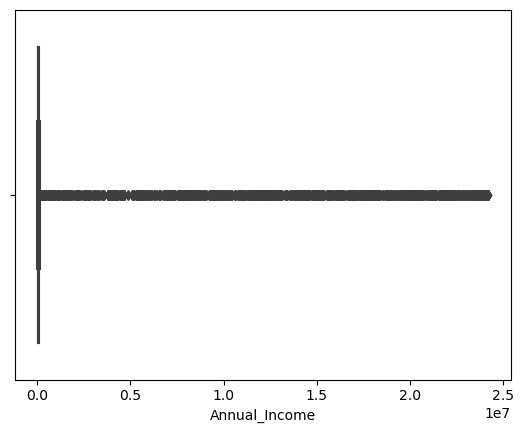

In [68]:
sns.boxplot(df2.Annual_Income)

In [69]:
df2['Monthly_Inhand_Salary'].describe()

count    88428.000000
mean      4034.174145
std       2963.769790
min        303.645417
25%       1797.087708
50%       3093.745000
75%       5386.907500
max      15204.633333
Name: Monthly_Inhand_Salary, dtype: float64

<AxesSubplot:xlabel='Monthly_Inhand_Salary'>

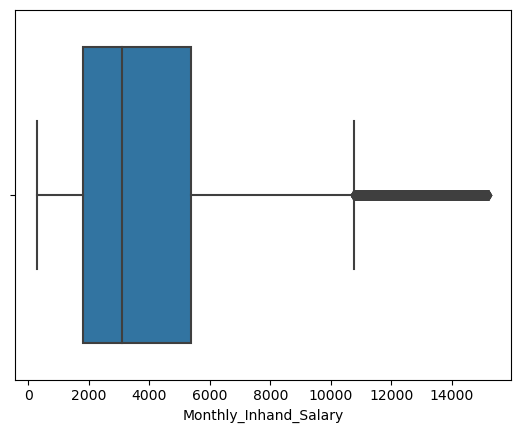

In [70]:
sns.boxplot(df2.Monthly_Inhand_Salary)

In [71]:
df2['Num_Bank_Accounts'].describe()

count    88428.000000
mean        17.154827
std        117.775203
min         -1.000000
25%          3.000000
50%          6.000000
75%          7.000000
max       1798.000000
Name: Num_Bank_Accounts, dtype: float64

In [72]:
df2 = df2.drop('Num_Bank_Accounts',axis=1)

In [73]:
df2.shape

(88428, 21)

In [74]:
df2['Num_Credit_Card'].describe()

count    88428.000000
mean        22.680260
std        129.757757
min          0.000000
25%          4.000000
50%          5.000000
75%          7.000000
max       1499.000000
Name: Num_Credit_Card, dtype: float64

In [75]:
num = df2[df2['Num_Credit_Card']>7]
num.shape

(14850, 21)

<AxesSubplot:xlabel='Num_Credit_Card'>

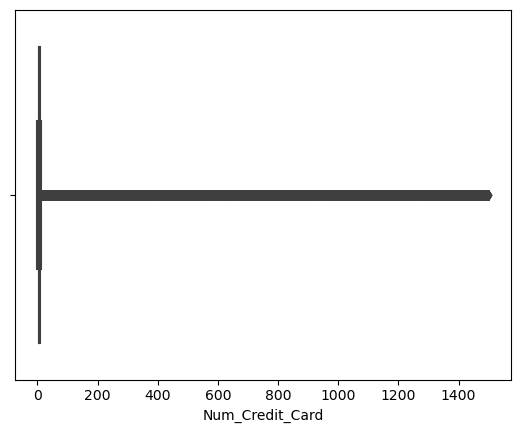

In [76]:
sns.boxplot(df2.Num_Credit_Card)

In [77]:
dd = df2['Num_Credit_Card'].quantile(.97)
dd

10.0

In [78]:
ds = df2[df2['Num_Credit_Card']>10.0]
ds.shape

(2080, 21)

In [79]:
df2 = df2[df2['Num_Credit_Card']<10.0]
df2.shape

(82031, 21)

In [80]:
df2['Num_Credit_Card'].describe()

count    82031.000000
mean         5.297107
std          1.838549
min          0.000000
25%          4.000000
50%          5.000000
75%          7.000000
max          9.000000
Name: Num_Credit_Card, dtype: float64

In [81]:
df2['Interest_Rate'].describe()

count    82031.000000
mean        72.792469
std        470.205559
min          1.000000
25%          7.000000
50%         12.000000
75%         20.000000
max       5797.000000
Name: Interest_Rate, dtype: float64

In [82]:
dd= df2[df2['Interest_Rate']>29]
dd.shape

(7441, 21)

In [83]:
ss = df2.Interest_Rate.quantile(0.97)
ss

34.0

In [84]:
dd= df2[df2['Interest_Rate']>34]
dd.shape

(1687, 21)

In [85]:
df2 = df2[df2['Interest_Rate']<=ss]
df2.shape

(80344, 21)

In [86]:
df2['Interest_Rate'].describe()

count    80344.000000
mean        14.006696
std          8.554519
min          1.000000
25%          7.000000
50%         12.000000
75%         19.000000
max         34.000000
Name: Interest_Rate, dtype: float64

In [87]:
df2['Num_of_Loan'].value_counts()

3        11884
2        11794
4        11594
0         8793
1         8518
6         5487
7         5205
5         5100
-100      3132
9         2539
8         2142
2_         645
4_         584
3_         579
0_         461
1_         442
7_         321
6_         293
5_         239
9_         113
8_         110
1150         4
172          2
275          2
1353         2
31           2
290          2
955          2
58           2
141          2
430          2
33           2
1365         2
1228         2
23           2
1209         2
855          2
911          2
1463         2
288          2
192          2
284          2
898          2
1354         2
875          2
404          2
1384         2
936          2
1214         2
50           2
49           2
1127         2
1412         2
501          2
1017         2
466          2
1464         2
1159         1
1023         1
1077         1
910          1
1457         1
991          1
701          1
1447         1
785_         1
1382      

In [88]:
df2 = df2.drop('Num_of_Loan',axis=1)

In [89]:
df2.shape

(80344, 20)

In [90]:
df2['Delay_from_due_date'].describe()

count    80344.000000
mean        20.203052
std         14.366717
min         -5.000000
25%          9.000000
50%         17.000000
75%         27.000000
max         67.000000
Name: Delay_from_due_date, dtype: float64

In [91]:
dd = df2[df2['Delay_from_due_date']<0]
dd.shape

(489, 20)

In [92]:
df2 = df2[df2['Delay_from_due_date']>0]
df2.shape

(78834, 20)

In [93]:
df2['Delay_from_due_date'].describe()

count    78834.000000
mean        20.603572
std         14.205354
min          1.000000
25%         10.000000
50%         17.000000
75%         27.000000
max         67.000000
Name: Delay_from_due_date, dtype: float64

In [94]:
df2['Changed_Credit_Limit'].value_counts()

_                        1639
8.22                      116
10.06                     100
11.32                      98
11.5                       97
7.35                       93
7.33                       93
11.49                      93
9.25                       93
8.23                       93
3.93                       90
8.76                       89
8.99                       88
1.63                       87
9.88                       85
11.78                      85
11.95                      84
8.3                        84
9.13                       84
10.3                       83
7.69                       82
10.54                      82
11.63                      82
9.18                       81
7.66                       80
7.75                       80
7.23                       80
9.58                       79
8.54                       79
11.73                      78
7.01                       78
7.91                       78
0.57                       77
7.98      

In [95]:
df2['Changed_Credit_Limit'] = df2['Changed_Credit_Limit'].replace(['_'],0)

In [96]:
df2['Changed_Credit_Limit'].describe()

count     78834
unique     4200
top           0
freq       1639
Name: Changed_Credit_Limit, dtype: int64

In [97]:
df2['Changed_Credit_Limit'] = df2['Changed_Credit_Limit'].astype(float)

In [98]:
df2['Changed_Credit_Limit']=df2['Changed_Credit_Limit'].round(2)

In [99]:
df2['Changed_Credit_Limit'].head()

0    11.27
3     6.27
4    11.27
5     9.27
6    11.27
Name: Changed_Credit_Limit, dtype: float64

In [100]:
df2['Num_Credit_Inquiries'].describe()

count    78834.000000
mean        26.962364
std        189.374878
min          0.000000
25%          3.000000
50%          5.000000
75%          8.000000
max       2594.000000
Name: Num_Credit_Inquiries, dtype: float64

In [101]:
ddd = df2['Num_Credit_Inquiries'].quantile(.98)
ddd

16.0

In [102]:
gg = df2[df2['Num_Credit_Inquiries']>ddd]
gg.shape

(1492, 20)

In [103]:
df2 = df2[df2['Num_Credit_Inquiries']<ddd]
df2.shape

(77009, 20)

In [104]:
df2.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23,Scientist,19114,1824.843333,4,3,3,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
3,April,23,Scientist,19114,3093.745000,4,3,5,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,May,23,Scientist,19114,1824.843333,4,3,6,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
5,June,23,Scientist,19114,3093.745000,4,3,8,9.27,4.0,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.430172331195294,!@9#%8,340.4792117872438,Good
6,July,23,Scientist,19114,1824.843333,4,3,3,11.27,4.0,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.3440674122349,Low_spent_Small_value_payments,244.5653167062043,Good


In [105]:
df2['Credit_Mix'].value_counts()

Standard    29487
Good        19039
_           15590
Bad         12893
Name: Credit_Mix, dtype: int64

In [106]:
df2['Credit_Mix'] = df2['Credit_Mix'].replace(['_'],'unknow')

In [107]:
df2['Credit_Mix'].value_counts()

Standard    29487
Good        19039
unknow      15590
Bad         12893
Name: Credit_Mix, dtype: int64

In [108]:
df2['Outstanding_Debt'].value_counts()

1151.7      21
1109.03     21
1360.45     19
460.46      17
1072.42     16
717.37      16
1351.42     16
850.79      16
668.14      16
715.37      16
1428.31     16
1344.45     16
794.53      15
1948.98     15
824.36      15
1803.18     15
55.46       15
883.26      15
2089.58     15
1381.1      15
64.65       15
100.3       15
1812.46     15
2538.81     15
439.34      15
129.15      15
404.81      15
255.76      15
57.51       15
498.81      15
849.98      15
291.71      15
421.66      15
967.75      15
2696.09     15
557.78      15
1254.45     15
1408.66     15
687.87      15
467.7       15
2646.0      15
796.88      15
1478.07     15
1208.29     15
156.76      15
332.47      15
314.58      15
950.59      14
327.22      14
559.35      14
183.15      14
1453.63     14
834.87      14
395.46      14
451.16      14
330.98      14
81.9        14
1456.12     14
1362.09     14
1158.96     14
240.27      14
935.74      14
1370.19     14
28.15       14
1377.16     14
1445.81     14
861.13    

In [109]:
df2['Outstanding_Debt'] = df2['Outstanding_Debt'].str.split('.',0).str[0]

In [110]:
df2['Outstanding_Debt'] = df2['Outstanding_Debt'].astype(int)

In [111]:
df2['Outstanding_Debt'].describe()

count    77009.000000
mean      1358.826644
std       1118.681713
min          0.000000
25%        544.000000
50%       1106.000000
75%       1763.000000
max       4998.000000
Name: Outstanding_Debt, dtype: float64

In [112]:
df2['Credit_Utilization_Ratio'].describe()

count    77009.000000
mean        32.316818
std          5.124525
min         20.172942
25%         28.080287
50%         32.341714
75%         36.531426
max         50.000000
Name: Credit_Utilization_Ratio, dtype: float64

In [113]:
df2['Credit_History_Age'].value_counts()

17 Years and 9 Months     383
15 Years and 9 Months     381
19 Years and 5 Months     381
19 Years and 3 Months     378
18 Years and 4 Months     378
15 Years and 11 Months    375
19 Years and 4 Months     373
19 Years and 9 Months     373
17 Years and 10 Months    372
17 Years and 11 Months    372
18 Years and 3 Months     369
15 Years and 10 Months    366
18 Years and 5 Months     363
16 Years and 2 Months     360
15 Years and 8 Months     359
18 Years and 2 Months     359
18 Years and 11 Months    356
17 Years and 8 Months     354
18 Years and 10 Months    350
18 Years and 8 Months     347
17 Years and 3 Months     347
19 Years and 2 Months     346
19 Years and 10 Months    346
19 Years and 8 Months     345
18 Years and 9 Months     344
17 Years and 5 Months     344
17 Years and 2 Months     344
16 Years and 3 Months     344
16 Years and 5 Months     343
19 Years and 11 Months    336
16 Years and 4 Months     335
16 Years and 8 Months     332
17 Years and 4 Months     332
16 Years a

In [114]:
df2 = df2.drop('Credit_History_Age',axis=1)
df2.shape

(77009, 19)

In [115]:
df2['Payment_of_Min_Amount'].value_counts()

Yes    39390
No     28405
NM      9214
Name: Payment_of_Min_Amount, dtype: int64

In [116]:
df2['Payment_of_Min_Amount'] = df2['Payment_of_Min_Amount'].replace(['NM'],'No')

In [117]:
df2['Payment_of_Min_Amount'].value_counts()

Yes    39390
No     37619
Name: Payment_of_Min_Amount, dtype: int64

In [118]:
df2['Total_EMI_per_month'].describe()

count    77009.000000
mean      1410.700522
std       8302.721280
min          0.000000
25%         29.602331
50%         68.461289
75%        160.051967
max      82331.000000
Name: Total_EMI_per_month, dtype: float64

In [119]:
ss = df2['Total_EMI_per_month'].quantile(.97)
ss

5937.839999999953

In [120]:
dd = df2[df2['Total_EMI_per_month']>ss]
dd.shape

(2311, 19)

In [121]:
df2 = df2[df2['Total_EMI_per_month']<ss]
df2.shape

(74698, 19)

In [122]:
df2['Total_EMI_per_month'].describe()

count    74698.000000
mean       113.262357
std        209.384618
min          0.000000
25%         28.532575
50%         65.914626
75%        146.363619
max       5931.000000
Name: Total_EMI_per_month, dtype: float64

In [123]:
df2['Amount_invested_monthly']=df2['Amount_invested_monthly'].astype(float)

In [124]:
df2['Amount_invested_monthly'].describe()

count    74698.000000
mean       186.543025
std        197.416885
min          0.000000
25%         68.756540
50%        122.714407
75%        224.592235
max       1977.326102
Name: Amount_invested_monthly, dtype: float64

In [125]:
df2['Amount_invested_monthly'] = df2['Amount_invested_monthly'].round(2)

In [126]:
df2['Payment_Behaviour'].value_counts()

Low_spent_Small_value_payments      18809
High_spent_Medium_value_payments    13141
High_spent_Large_value_payments     10412
Low_spent_Medium_value_payments     10339
High_spent_Small_value_payments      8498
Low_spent_Large_value_payments       7829
!@9#%8                               5670
Name: Payment_Behaviour, dtype: int64

In [127]:
df2['Payment_Behaviour'] = df2['Payment_Behaviour'].replace(['!@9#%8'], 'unknow')

In [128]:
df2['Payment_Behaviour'].value_counts()

Low_spent_Small_value_payments      18809
High_spent_Medium_value_payments    13141
High_spent_Large_value_payments     10412
Low_spent_Medium_value_payments     10339
High_spent_Small_value_payments      8498
Low_spent_Large_value_payments       7829
unknow                               5670
Name: Payment_Behaviour, dtype: int64

In [129]:
df2['Monthly_Balance']=df2['Monthly_Balance'].astype(float)

In [130]:
df2['Monthly_Balance'].describe()

count    74698.000000
mean       406.736837
std        215.099441
min          0.007760
25%        273.210846
50%        338.530981
75%        475.394690
max       1602.040519
Name: Monthly_Balance, dtype: float64

In [131]:
df2['Credit_Score'].value_counts()

Standard    40733
Poor        20478
Good        13487
Name: Credit_Score, dtype: int64

In [132]:
# check unique value
col_with_1_unique_value= df2.nunique()==1
print('total number of unquie value - ', col_with_1_unique_value.sum())

total number of unquie value -  0


In [133]:
df2.isnull().sum()*100/df.shape[0]

Month                       0.0
Age                         0.0
Occupation                  0.0
Annual_Income               0.0
Monthly_Inhand_Salary       0.0
Num_Credit_Card             0.0
Interest_Rate               0.0
Delay_from_due_date         0.0
Changed_Credit_Limit        0.0
Num_Credit_Inquiries        0.0
Credit_Mix                  0.0
Outstanding_Debt            0.0
Credit_Utilization_Ratio    0.0
Payment_of_Min_Amount       0.0
Total_EMI_per_month         0.0
Amount_invested_monthly     0.0
Payment_Behaviour           0.0
Monthly_Balance             0.0
Credit_Score                0.0
dtype: float64

In [134]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74698 entries, 0 to 99999
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Month                     74698 non-null  object 
 1   Age                       74698 non-null  int32  
 2   Occupation                74698 non-null  object 
 3   Annual_Income             74698 non-null  int32  
 4   Monthly_Inhand_Salary     74698 non-null  float64
 5   Num_Credit_Card           74698 non-null  int64  
 6   Interest_Rate             74698 non-null  int64  
 7   Delay_from_due_date       74698 non-null  int64  
 8   Changed_Credit_Limit      74698 non-null  float64
 9   Num_Credit_Inquiries      74698 non-null  float64
 10  Credit_Mix                74698 non-null  object 
 11  Outstanding_Debt          74698 non-null  int32  
 12  Credit_Utilization_Ratio  74698 non-null  float64
 13  Payment_of_Min_Amount     74698 non-null  object 
 14  Total_

In [135]:
cat_value = ['Month','Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour']
num_value = ['Age', 'Annual_Income', 'Interest_Rate', 'Delay_from_due_date', 'Outstanding_Debt', 'Monthly_Balance', 
             'Amount_invested_monthly', 'Total_EMI_per_month', 'Credit_Utilization_Ratio', 'Num_Credit_Inquiries',
             'Changed_Credit_Limit', 'Monthly_Inhand_Salary','Num_Credit_Card']


## Feature Engineering

In [136]:
df2["Credit_Score"].value_counts()

Standard    40733
Poor        20478
Good        13487
Name: Credit_Score, dtype: int64

In [137]:
df2['Credit_Score'] = df2['Credit_Score'].replace(['Standard'],'Good')

In [138]:
df2["Credit_Score"].value_counts()

Good    54220
Poor    20478
Name: Credit_Score, dtype: int64

In [139]:
df2['Credit_Score'] = df2['Credit_Score'].replace(['Good'],0)
df2['Credit_Score'] = df2['Credit_Score'].replace(['Poor'],1)

In [140]:
df2["Credit_Score"].value_counts()

0    54220
1    20478
Name: Credit_Score, dtype: int64

In [141]:
poor = (sum(df2['Credit_Score'])/len(df2['Credit_Score'].index))*100
poor

27.41438860478192

## dummy variable

In [142]:
dummy = pd.get_dummies(df2[cat_value],drop_first=True)
df2 = pd.concat([df2,dummy],axis=1)

In [143]:
df2.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Month_August,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Occupation_Architect,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Media_Manager,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Unknow,Occupation_Writer,Credit_Mix_Good,Credit_Mix_Standard,Credit_Mix_unknow,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments,Payment_Behaviour_unknow
0,January,23,Scientist,19114,1824.843333,4,3,3,11.27,4.0,unknow,809,26.822620,No,49.574949,80.42,High_spent_Small_value_payments,312.494089,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0
3,April,23,Scientist,19114,3093.745000,4,3,5,6.27,4.0,Good,809,31.377862,No,49.574949,199.46,Low_spent_Small_value_payments,223.451310,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
4,May,23,Scientist,19114,1824.843333,4,3,6,11.27,4.0,Good,809,24.797347,No,49.574949,41.42,High_spent_Medium_value_payments,341.489231,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
5,June,23,Scientist,19114,3093.745000,4,3,8,9.27,4.0,Good,809,27.262259,No,49.574949,62.43,unknow,340.479212,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
6,July,23,Scientist,19114,1824.843333,4,3,3,11.27,4.0,Good,809,22.537593,No,49.574949,178.34,Low_spent_Small_value_payments,244.565317,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0


In [144]:
df2.shape

(74698, 51)

In [145]:
df2 = df2.drop(cat_value,axis=1)

In [146]:
df2.shape

(74698, 46)

In [147]:
df2.head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score,Month_August,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Occupation_Architect,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Media_Manager,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Unknow,Occupation_Writer,Credit_Mix_Good,Credit_Mix_Standard,Credit_Mix_unknow,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments,Payment_Behaviour_unknow
0,23,19114,1824.843333,4,3,3,11.27,4.0,809,26.822620,49.574949,80.42,312.494089,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0
3,23,19114,3093.745000,4,3,5,6.27,4.0,809,31.377862,49.574949,199.46,223.451310,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
4,23,19114,1824.843333,4,3,6,11.27,4.0,809,24.797347,49.574949,41.42,341.489231,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
5,23,19114,3093.745000,4,3,8,9.27,4.0,809,27.262259,49.574949,62.43,340.479212,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
6,23,19114,1824.843333,4,3,3,11.27,4.0,809,22.537593,49.574949,178.34,244.565317,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0


# Model Building

In [148]:
from sklearn.model_selection import train_test_split

In [149]:
x= df2.drop('Credit_Score',axis=1)
x.head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_August,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Occupation_Architect,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Media_Manager,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Unknow,Occupation_Writer,Credit_Mix_Good,Credit_Mix_Standard,Credit_Mix_unknow,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments,Payment_Behaviour_unknow
0,23,19114,1824.843333,4,3,3,11.27,4.0,809,26.822620,49.574949,80.42,312.494089,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0
3,23,19114,3093.745000,4,3,5,6.27,4.0,809,31.377862,49.574949,199.46,223.451310,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
4,23,19114,1824.843333,4,3,6,11.27,4.0,809,24.797347,49.574949,41.42,341.489231,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
5,23,19114,3093.745000,4,3,8,9.27,4.0,809,27.262259,49.574949,62.43,340.479212,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
6,23,19114,1824.843333,4,3,3,11.27,4.0,809,22.537593,49.574949,178.34,244.565317,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0


In [150]:
y = df2['Credit_Score']
y.head()

0    0
3    0
4    0
5    0
6    0
Name: Credit_Score, dtype: int64

In [151]:
x_train,x_test,y_train,y_test = train_test_split(x,y, train_size=0.7, test_size=0.3, random_state=100)

print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(52288, 45)
(22410, 45)
(52288,)
(22410,)


## outlier treatment

In [152]:
from sklearn.preprocessing import StandardScaler

In [153]:
scaler = StandardScaler()
x_train[num_value] = scaler.fit_transform(x_train[num_value])
x_train.head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_August,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Occupation_Architect,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Media_Manager,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Unknow,Occupation_Writer,Credit_Mix_Good,Credit_Mix_Standard,Credit_Mix_unknow,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments,Payment_Behaviour_unknow
78816,0.134713,-0.114870,-0.334584,-0.171247,-0.479571,-0.954093,-0.630060,-0.692153,-0.745588,-0.018256,-0.537840,-0.214220,-0.620122,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
38410,-1.714995,-0.102588,-0.334584,-0.171247,0.458167,-0.600711,1.352744,0.672259,2.166156,-1.461721,0.130616,-0.947097,-0.649604,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
76598,1.706964,-0.102602,-0.538368,-0.718635,-1.300091,-0.176652,-0.463837,-0.419271,-1.065333,1.195284,-0.346935,-0.310916,-0.249523,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
7858,-0.050258,-0.114699,-1.046600,-0.171247,0.340949,-0.671387,0.248548,0.126494,-0.152670,0.844858,-0.450709,-0.852538,-0.500061,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0
40218,-1.714995,-0.098162,-0.404678,-1.266023,-0.362354,-0.530034,0.257453,-0.419271,-0.517198,-0.956998,-0.076560,-0.721863,-0.090844,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0


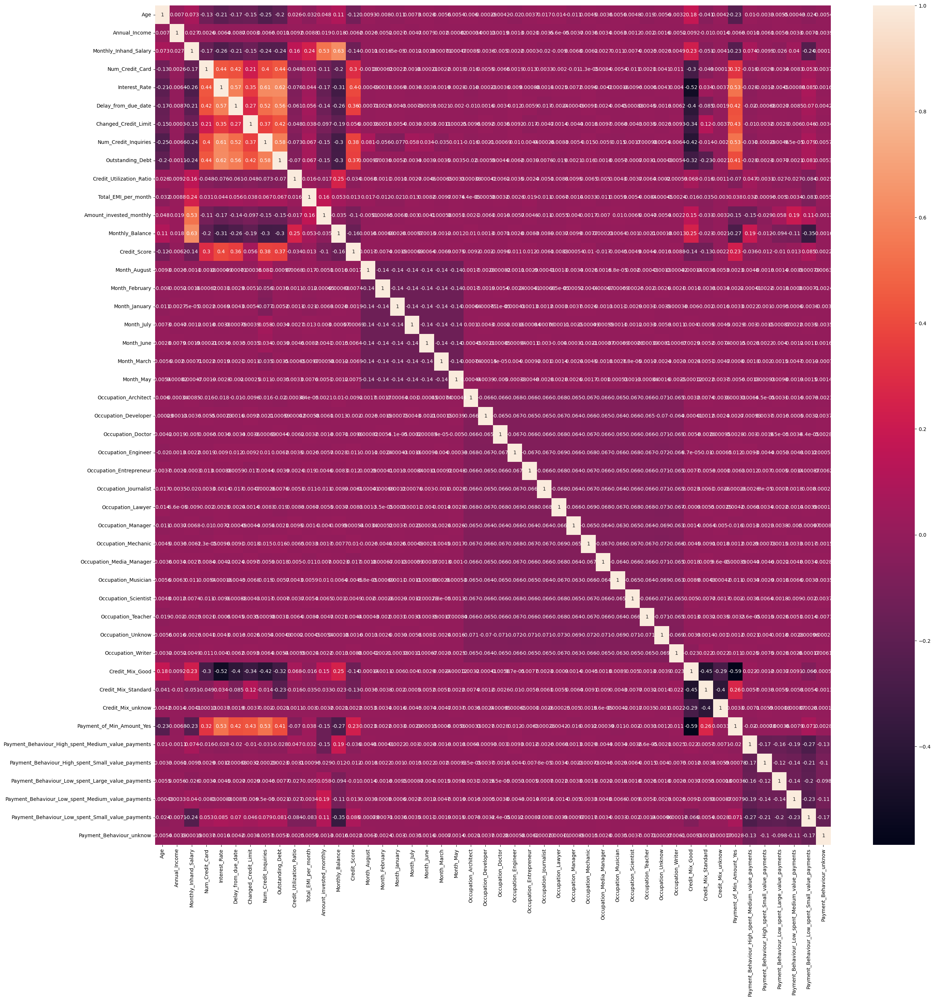

In [154]:
plt.figure(figsize=(30,30))
sns.heatmap(df2.corr(),annot=True)
plt.show()

## Handling Imbalanced Dataset


#### using SMOTE

In [155]:
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
x_train_sm, y_train_sm = sm.fit_resample(x_train, y_train)


In [156]:
print(x_train_sm.shape)
print(y_train_sm.shape)

(76018, 45)
(76018,)


### Running Your First Training Model

In [157]:
import statsmodels.api as sm

In [158]:
logm1 = sm.GLM(y_train_sm,(sm.add_constant(x_train_sm)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:           Credit_Score   No. Observations:                76018
Model:                            GLM   Df Residuals:                    75972
Model Family:                Binomial   Df Model:                           45
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -33397.
Date:                Fri, 12 May 2023   Deviance:                       66793.
Time:                        11:07:40   Pearson chi2:                 7.90e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3981
Covariance Type:            nonrobust                                         
======================================================================================================================
                                                         coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------
const                                                  3.3369      0.047     71.518      0.000       3.245       3.428
Age                                                   -0.0870      0.010     -8.377      0.000      -0.107      -0.067
Annual_Income                                         -0.0379      0.010     -3.649      0.000      -0.058      -0.018
Monthly_Inhand_Salary                                 -0.0255      0.020     -1.277      0.201      -0.065       0.014
Num_Credit_Card                                        0.2561      0.012     21.949      0.000       0.233       0.279
Interest_Rate                                          0.4904      0.015     32.965      0.000       0.461       0.520
Delay_from_due_date                                    0.2308      0.013     17.908      0.000       0.206       0.256
Changed_Credit_Limit                                  -0.3713      0.012    -31.804      0.000      -0.394      -0.348
Num_Credit_Inquiries                                   0.4407      0.014     30.592      0.000       0.412       0.469
Outstanding_Debt                                       0.1777      0.016     11.421      0.000       0.147       0.208
Credit_Utilization_Ratio                               0.0177      0.010      1.747      0.081      -0.002       0.038
Total_EMI_per_month                                   -0.0862      0.012     -7.159      0.000      -0.110      -0.063
Amount_invested_monthly                               -0.0620      0.016     -3.818      0.000      -0.094      -0.030
Monthly_Balance                                       -0.1067      0.018     -5.926      0.000      -0.142      -0.071
Month_August                                          -1.4637      0.036    -40.944      0.000      -1.534      -1.394
Month_February                                        -1.4545      0.036    -40.491      0.000      -1.525      -1.384
Month_January                                         -1.4159      0.036    -39.615      0.000      -1.486      -1.346
Month_July                                            -1.4564      0.036    -40.925      0.000      -1.526      -1.387
Month_June                                            -1.3542      0.035    -38.313      0.000      -1.423      -1.285
Month_March                                           -1.4590      0.036    -40.938      0.000      -1.529      -1.389
Month_May                                             -1.3293      0.035    -37.486      0.000      -1.399      -1.260
Occupation_Architect                                  -2.0572      0.048    -42.457      0.000      -2.152      -1.962
Occupation_Developer                                  -2.1707      0.049    -44.336      0.000      -2.267  

In [159]:
x_train_sm = x_train_sm.drop(['Monthly_Inhand_Salary','Credit_Utilization_Ratio'], axis=1)

In [160]:
x_train_sm.head()


,Age,Annual_Income,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_August,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Occupation_Architect,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Media_Manager,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Unknow,Occupation_Writer,Credit_Mix_Good,Credit_Mix_Standard,Credit_Mix_unknow,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments,Payment_Behaviour_unknow
0,0.134713,-0.114870,-0.171247,-0.479571,-0.954093,-0.630060,-0.692153,-0.745588,-0.537840,-0.214220,-0.620122,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
1,-1.714995,-0.102588,-0.171247,0.458167,-0.600711,1.352744,0.672259,2.166156,0.130616,-0.947097,-0.649604,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
2,1.706964,-0.102602,-0.718635,-1.300091,-0.176652,-0.463837,-0.419271,-1.065333,-0.346935,-0.310916,-0.249523,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
3,-0.050258,-0.114699,-0.171247,0.340949,-0.671387,0.248548,0.126494,-0.152670,-0.450709,-0.852538,-0.500061,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0
4,-1.714995,-0.098162,-1.266023,-0.362354,-0.530034,0.257453,-0.419271,-0.517198,-0.076560,-0.721863,-0.090844,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0


#### Running Your 2nd Training Model

In [161]:
x_train_smm = sm.add_constant(x_train_sm)
logm3 = sm.GLM(y_train_sm,x_train_smm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:           Credit_Score   No. Observations:                76018
Model:                            GLM   Df Residuals:                    75974
Model Family:                Binomial   Df Model:                           43
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -33399.
Date:                Fri, 12 May 2023   Deviance:                       66798.
Time:                        11:07:43   Pearson chi2:                 7.90e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3980
Covariance Type:            nonrobust                                         
======================================================================================================================
                                                         coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------
const                                                  3.3345      0.047     71.551      0.000       3.243       3.426
Age                                                   -0.0869      0.010     -8.367      0.000      -0.107      -0.067
Annual_Income                                         -0.0380      0.010     -3.662      0.000      -0.058      -0.018
Num_Credit_Card                                        0.2562      0.012     21.959      0.000       0.233       0.279
Interest_Rate                                          0.4902      0.015     32.958      0.000       0.461       0.519
Delay_from_due_date                                    0.2308      0.013     17.907      0.000       0.206       0.256
Changed_Credit_Limit                                  -0.3716      0.012    -31.845      0.000      -0.395      -0.349
Num_Credit_Inquiries                                   0.4406      0.014     30.590      0.000       0.412       0.469
Outstanding_Debt                                       0.1776      0.016     11.415      0.000       0.147       0.208
Total_EMI_per_month                                   -0.0896      0.012     -7.628      0.000      -0.113      -0.067
Amount_invested_monthly                               -0.0766      0.012     -6.536      0.000      -0.100      -0.054
Monthly_Balance                                       -0.1180      0.013     -9.291      0.000      -0.143      -0.093
Month_August                                          -1.4635      0.036    -40.941      0.000      -1.534      -1.393
Month_February                                        -1.4547      0.036    -40.503      0.000      -1.525      -1.384
Month_January                                         -1.4162      0.036    -39.625      0.000      -1.486      -1.346
Month_July                                            -1.4568      0.036    -40.935      0.000      -1.527      -1.387
Month_June                                            -1.3547      0.035    -38.330      0.000      -1.424      -1.285
Month_March                                           -1.4595      0.036    -40.950      0.000      -1.529      -1.390
Month_May                                             -1.3293      0.035    -37.488      0.000      -1.399      -1.260
Occupation_Architect                                  -2.0579      0.048    -42.474      0.000      -2.153      -1.963
Occupation_Developer                                  -2.1710      0.049    -44.342      0.000      -2.267      -2.075
Occupation_Doctor                                     -2.1782      0.048    -44.947      0.000      -2.273      -2.083
Occupation_Engineer                                   -1.9735      0.047    -42.438      0.000      -2.065  

In [162]:
x_train_sm = x_train_sm.drop(['Payment_of_Min_Amount_Yes'], axis=1)

#### Running Your 3rd Training Model

In [163]:
x_train_sm2 = sm.add_constant(x_train_sm)
logm2 = sm.GLM(y_train_sm,x_train_sm2, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:           Credit_Score   No. Observations:                76018
Model:                            GLM   Df Residuals:                    75975
Model Family:                Binomial   Df Model:                           42
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -33400.
Date:                Fri, 12 May 2023   Deviance:                       66801.
Time:                        11:07:46   Pearson chi2:                 7.90e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3980
Covariance Type:            nonrobust                                         
======================================================================================================================
                                                         coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------
const                                                  3.3576      0.044     75.892      0.000       3.271       3.444
Age                                                   -0.0880      0.010     -8.485      0.000      -0.108      -0.068
Annual_Income                                         -0.0381      0.010     -3.666      0.000      -0.058      -0.018
Num_Credit_Card                                        0.2567      0.012     22.009      0.000       0.234       0.280
Interest_Rate                                          0.4928      0.015     33.323      0.000       0.464       0.522
Delay_from_due_date                                    0.2317      0.013     17.999      0.000       0.206       0.257
Changed_Credit_Limit                                  -0.3690      0.012    -31.954      0.000      -0.392      -0.346
Num_Credit_Inquiries                                   0.4451      0.014     31.530      0.000       0.417       0.473
Outstanding_Debt                                       0.1783      0.016     11.457      0.000       0.148       0.209
Total_EMI_per_month                                   -0.0893      0.012     -7.605      0.000      -0.112      -0.066
Amount_invested_monthly                               -0.0774      0.012     -6.610      0.000      -0.100      -0.054
Monthly_Balance                                       -0.1191      0.013     -9.387      0.000      -0.144      -0.094
Month_August                                          -1.4641      0.036    -40.962      0.000      -1.534      -1.394
Month_February                                        -1.4534      0.036    -40.478      0.000      -1.524      -1.383
Month_January                                         -1.4147      0.036    -39.599      0.000      -1.485      -1.345
Month_July                                            -1.4568      0.036    -40.939      0.000      -1.527      -1.387
Month_June                                            -1.3545      0.035    -38.326      0.000      -1.424      -1.285
Month_March                                           -1.4586      0.036    -40.933      0.000      -1.528      -1.389
Month_May                                             -1.3294      0.035    -37.491      0.000      -1.399      -1.260
Occupation_Architect                                  -2.0566      0.048    -42.458      0.000      -2.152      -1.962
Occupation_Developer                                  -2.1709      0.049    -44.337      0.000      -2.267      -2.075
Occupation_Doctor                                     -2.1775      0.048    -44.939      0.000      -2.272      -2.083
Occupation_Engineer                                   -1.9720      0.046    -42.417      0.000      -2.063  

In [164]:
# Getting the predicted values on the train set
y_train_pred = res.predict(x_train_sm2)
y_train_pred[:10]

0    0.149189
1    0.336243
2    0.103940
3    0.362058
4    0.172323
5    0.370247
6    0.114016
7    0.204324
8    0.168918
9    0.106773
dtype: float64

In [165]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.1491887 , 0.33624293, 0.10394023, 0.36205843, 0.17232263,
       0.37024662, 0.11401633, 0.2043238 , 0.1689177 , 0.10677314])

#### Creating a dataframe with the actual Credit and the predicted probabilities

In [166]:
y_train_pred_final = pd.DataFrame({'Credit': y_train_sm.values, 'Credit_prob': y_train_pred})
y_train_pred_final['CustID'] = y_train_sm.index
y_train_pred_final.head()

,Credit,Credit_prob,CustID
0,0,0.149189,0
1,0,0.336243,1
2,0,0.103940,2
3,0,0.362058,3
4,0,0.172323,4


#### Creating new column 'predicted' with 1 if Credit_Prob > 0.5 else 0

In [167]:
y_train_pred_final['Prediction'] = y_train_pred_final.Credit_prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Credit,Credit_prob,CustID,Prediction
0,0,0.149189,0,0
1,0,0.336243,1,0
2,0,0.103940,2,0
3,0,0.362058,3,0
4,0,0.172323,4,0


In [168]:
from sklearn import metrics

In [169]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_pred_final.Credit, y_train_pred_final.Prediction)
print(confusion)

[[31220  6789]
 [ 8027 29982]]


In [170]:
# Predicted     not_churn    churn
# Actual
# not_churn        31220      6789
# churn            6789       29982 

In [171]:
# Let's check the overall accuracy
print(metrics.accuracy_score(y_train_pred_final.Credit, y_train_pred_final.Prediction))

0.8050987923912758


## Checking VIFs

In [172]:
# Check for the VIF values of the feature variables
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [173]:
x_train_sm2.columns

Index(['const', 'Age', 'Annual_Income', 'Num_Credit_Card', 'Interest_Rate',
       'Delay_from_due_date', 'Changed_Credit_Limit', 'Num_Credit_Inquiries',
       'Outstanding_Debt', 'Total_EMI_per_month', 'Amount_invested_monthly',
       'Monthly_Balance', 'Month_August', 'Month_February', 'Month_January',
       'Month_July', 'Month_June', 'Month_March', 'Month_May',
       'Occupation_Architect', 'Occupation_Developer', 'Occupation_Doctor',
       'Occupation_Engineer', 'Occupation_Entrepreneur',
       'Occupation_Journalist', 'Occupation_Lawyer', 'Occupation_Manager',
       'Occupation_Mechanic', 'Occupation_Media_Manager',
       'Occupation_Musician', 'Occupation_Scientist', 'Occupation_Teacher',
       'Occupation_Unknow', 'Occupation_Writer', 'Credit_Mix_Good',
       'Credit_Mix_Standard', 'Credit_Mix_unknow',
       'Payment_Behaviour_High_spent_Medium_value_payments',
       'Payment_Behaviour_High_spent_Small_value_payments',
       'Payment_Behaviour_Low_spent_Large_value

In [174]:
col = ['Age', 'Annual_Income', 'Num_Credit_Card', 'Interest_Rate',
       'Delay_from_due_date', 'Changed_Credit_Limit', 'Num_Credit_Inquiries',
       'Outstanding_Debt', 'Total_EMI_per_month', 'Amount_invested_monthly',
       'Monthly_Balance', 'Month_August', 'Month_February', 'Month_January',
       'Month_July', 'Month_June', 'Month_March', 'Month_May',
       'Occupation_Architect', 'Occupation_Developer', 'Occupation_Doctor',
       'Occupation_Engineer', 'Occupation_Entrepreneur',
       'Occupation_Journalist', 'Occupation_Lawyer', 'Occupation_Manager',
       'Occupation_Mechanic', 'Occupation_Media_Manager',
       'Occupation_Musician', 'Occupation_Scientist', 'Occupation_Teacher',
       'Occupation_Unknow', 'Occupation_Writer', 'Credit_Mix_Good',
       'Credit_Mix_Standard', 'Credit_Mix_unknow',
       'Payment_Behaviour_High_spent_Medium_value_payments',
       'Payment_Behaviour_High_spent_Small_value_payments',
       'Payment_Behaviour_Low_spent_Large_value_payments',
       'Payment_Behaviour_Low_spent_Medium_value_payments',
       'Payment_Behaviour_Low_spent_Small_value_payments',
       'Payment_Behaviour_unknow']

In [175]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Feature'] = x_train_sm[col].columns
vif['VIF'] = [variance_inflation_factor(x_train_sm[col].values,i) for i in range(x_train_sm[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Feature,VIF
34,Credit_Mix_Standard,2.84
33,Credit_Mix_Good,2.84
3,Interest_Rate,2.55
7,Outstanding_Debt,2.53
40,Payment_Behaviour_Low_spent_Small_value_payments,2.41
6,Num_Credit_Inquiries,2.27
4,Delay_from_due_date,1.87
35,Credit_Mix_unknow,1.82
39,Payment_Behaviour_Low_spent_Medium_value_payments,1.65
36,Payment_Behaviour_High_spent_Medium_value_paym...,1.60


In [176]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [177]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.7888131758267779

In [178]:
# Let us calculate specificity
TN / float(TN+FP)

0.8213844089557736

In [179]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.17861559104422636


In [180]:
# positive predictive value 
print (TP / float(TP+FP))

0.8153708085175818


In [181]:
# Negative predictive value
print (TN / float(TN+ FN))

0.7954748133615308


# Step 9: Plotting the ROC Curve
An ROC curve demonstrates several things:

1.It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).

2.The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.

3.The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test

In [182]:
def draw_roc(actual , probs):
    fpr, tpr, thresholds = metrics.roc_curve(actual, probs, drop_intermediate = False)
    auc_score = metrics.roc_auc_score(actual,probs)
    plt.figure(figsize=(5,5))
    plt.plot(fpr,tpr, label='ROC curve (area = %0.2f)' % auc_score)
    plt.plot([0,1],[0,1],'k--')
    plt.xlim([0.0,1.0])
    plt.ylim([0.0,1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [183]:
fpr, tpr, thresholds = metrics.roc_curve(y_train_pred_final.Credit, y_train_pred_final.Credit_prob, drop_intermediate = False )

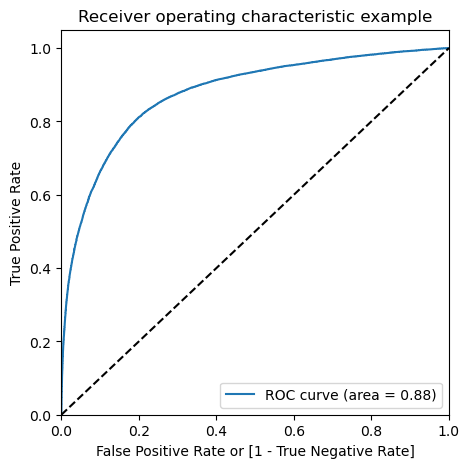

In [184]:
draw_roc(y_train_pred_final.Credit , y_train_pred_final.Credit_prob)

# Step 10: Finding Optimal Cutoff Point
Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [185]:
# Let's create columns with different probability cutoffs
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Credit_prob.map(lambda x:1 if x>i else 0)
y_train_pred_final.head()

,Credit,Credit_prob,CustID,Prediction,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.149189,0,0,1,1,0,0,0,0,0,0,0,0
1,0,0.336243,1,0,1,1,1,1,0,0,0,0,0,0
2,0,0.103940,2,0,1,1,0,0,0,0,0,0,0,0
3,0,0.362058,3,0,1,1,1,1,0,0,0,0,0,0
4,0,0.172323,4,0,1,1,0,0,0,0,0,0,0,0


In [186]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Credit, y_train_pred_final[i])
    total1 = sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] = [ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.588019  0.982662  0.193375
0.2   0.2  0.725289  0.931595  0.518982
0.3   0.3  0.782117  0.885738  0.678497
0.4   0.4  0.801652  0.841485  0.761820
0.5   0.5  0.805099  0.788813  0.821384
0.6   0.6  0.794720  0.719093  0.870346
0.7   0.7  0.770949  0.627141  0.914757
0.8   0.8  0.732405  0.512484  0.952327
0.9   0.9  0.667421  0.352522  0.982320


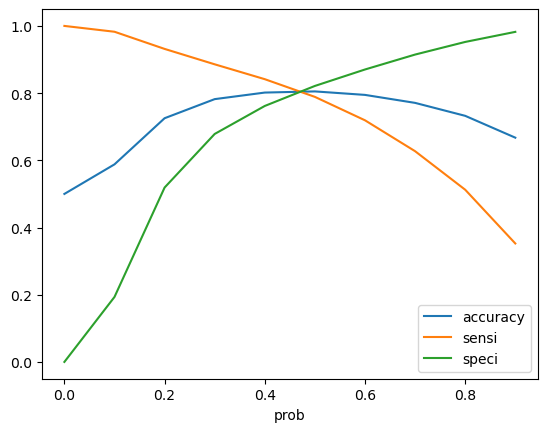

In [187]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the curve above, 0.5 is the optimum point to take it as a cutoff probability.

In [188]:
y_train_pred_final['final_pred'] = y_train_pred_final.Credit_prob.map( lambda x:1 if x>0.5 else 0)
y_train_pred_final.head()

,Credit,Credit_prob,CustID,Prediction,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_pred
0,0,0.149189,0,0,1,1,0,0,0,0,0,0,0,0,0
1,0,0.336243,1,0,1,1,1,1,0,0,0,0,0,0,0
2,0,0.103940,2,0,1,1,0,0,0,0,0,0,0,0,0
3,0,0.362058,3,0,1,1,1,1,0,0,0,0,0,0,0
4,0,0.172323,4,0,1,1,0,0,0,0,0,0,0,0,0


In [189]:
metrics.accuracy_score(y_train_pred_final.Credit, y_train_pred_final.final_pred)


0.8050987923912758

In [190]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Credit, y_train_pred_final.final_pred)
confusion2

array([[31220,  6789],
       [ 8027, 29982]], dtype=int64)

In [191]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [192]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.7888131758267779

In [193]:
# Let us calculate specificity
TN / float(TN+FP)

0.8213844089557736

In [194]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.17861559104422636


In [195]:
# Positive predictive value 
print (TP / float(TP+FP))

0.8153708085175818


In [196]:
# Negative predictive value
print (TN / float(TN+ FN))

0.7954748133615308


# Step 11: Making predictions on the test set

In [197]:
x_test[num_value] = scaler.transform(x_test[num_value])

In [198]:
x_test = x_test[col]
x_test.head()

,Age,Annual_Income,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_August,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Occupation_Architect,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Media_Manager,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Unknow,Occupation_Writer,Credit_Mix_Good,Credit_Mix_Standard,Credit_Mix_unknow,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments,Payment_Behaviour_unknow
51673,0.319684,-0.107076,0.376141,-0.127919,-0.176652,-1.240039,-0.965035,-1.059064,-0.479763,-0.720947,-0.026071,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
42492,0.134713,-0.107661,-2.360799,-0.714005,-1.095446,0.364310,-0.965035,-0.924717,-0.247292,-0.400644,-0.612588,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0
19963,-1.530024,-0.065040,0.376141,0.458167,-0.247328,1.305252,0.126494,0.717002,0.639516,2.349935,-1.461892,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
20955,-0.790141,-0.114303,-0.718635,-0.831222,-1.024770,-0.538044,-0.146388,-1.178185,-0.447379,-0.753501,-0.499771,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
10824,1.429508,15.486627,-1.266023,-0.596788,-0.388681,-1.346897,-1.237918,-0.693640,0.077796,1.236071,1.422501,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0


In [199]:
x_test_sm = sm.add_constant(x_test)

In [200]:
y_test_pred = res.predict(x_test_sm)

In [201]:
y_test_pred[:10]

51673    0.306299
42492    0.073137
19963    0.944296
20955    0.380546
10824    0.036247
96568    0.165910
88674    0.137176
55416    0.416021
47689    0.078357
16273    0.036594
dtype: float64

In [202]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [203]:
# Let's see the head
y_pred_1.head()

,0
51673,0.306299
42492,0.073137
19963,0.944296
20955,0.380546
10824,0.036247


In [204]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [205]:
# Putting CustID to index
y_test_df['CustID'] = y_test_df.index

In [206]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop = True, inplace = True)
y_test_df.reset_index(drop = True, inplace = True)

In [207]:
y_pred_final = pd.concat([y_pred_1,y_test_df],axis=1)
y_pred_final.head()

,0,Credit_Score,CustID
0,0.306299,0,51673
1,0.073137,0,42492
2,0.944296,0,19963
3,0.380546,0,20955
4,0.036247,0,10824


In [208]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Credit_Prob'})

In [209]:
# Rearranging the columns
y_pred_final = y_pred_final[['CustID','Credit_Score','Credit_Prob']]

In [210]:
y_pred_final.head()

,CustID,Credit_Score,Credit_Prob
0,51673,0,0.306299
1,42492,0,0.073137
2,19963,0,0.944296
3,20955,0,0.380546
4,10824,0,0.036247


In [211]:
y_pred_final['Credit_predition'] = y_pred_final.Credit_Prob.map(lambda x:1 if x>0.5 else 0)
y_pred_final.head()

,CustID,Credit_Score,Credit_Prob,Credit_predition
0,51673,0,0.306299,0
1,42492,0,0.073137,0
2,19963,0,0.944296,1
3,20955,0,0.380546,0
4,10824,0,0.036247,0


In [212]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Credit_Score, y_pred_final.Credit_predition)

0.7528781793842034

In [213]:
confusion2 = metrics.confusion_matrix(y_pred_final.Credit_Score, y_pred_final.Credit_predition )
confusion2

array([[13259,  2952],
       [ 2586,  3613]], dtype=int64)

In [214]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [215]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.5828359412808517

In [216]:
# Let us calculate specificity
TN / float(TN+FP)

0.8179014249583616

# Using Decision Trees

In [217]:
x_train,x_test,y_train,y_test = train_test_split(x,y,train_size=0.7,random_state=100)

In [218]:
x_train.shape, x_test.shape

((52288, 45), (22410, 45))

In [219]:
y_train.shape, y_test.shape

((52288,), (22410,))

In [220]:
from sklearn.tree import DecisionTreeClassifier

In [221]:
dt_base = DecisionTreeClassifier(random_state=42, max_depth=4)

In [222]:
dt_base.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

In [223]:
y_train_pred = dt_base.predict(x_train)
y_test_pred = dt_base.predict(x_test)

In [224]:
from sklearn.metrics import classification_report

In [225]:
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.84      0.93      0.88     16211
           1       0.75      0.55      0.64      6199

    accuracy                           0.82     22410
   macro avg       0.79      0.74      0.76     22410
weighted avg       0.82      0.82      0.82     22410



#### Plot the ROC curve

In [226]:
from sklearn.metrics import plot_roc_curve

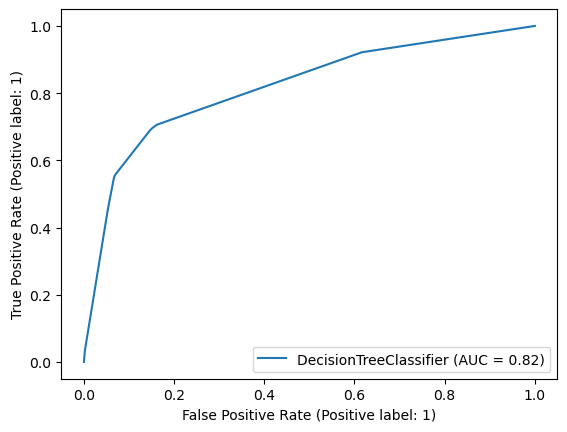

In [227]:
plot_roc_curve(dt_base, x_train, y_train, drop_intermediate=False)
plt.show()

### Hyper-parameter tuning for the Decision Tree

In [228]:
from sklearn.model_selection import GridSearchCV

In [229]:
dt = DecisionTreeClassifier(random_state=42)

In [230]:
params = {
    "max_depth": [2,3,5,10,20],
    "min_samples_leaf": [5,10,20,50,100,500]
}

In [231]:
grid_search = GridSearchCV(estimator=dt,
                           param_grid=params,
                           cv=4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

In [232]:
%%time
grid_search.fit(x_train,y_train)

Fitting 4 folds for each of 30 candidates, totalling 120 fits
Wall time: 16.7 s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 500]},
             scoring='accuracy', verbose=1)

In [233]:
grid_search.best_score_

0.830764228886169

In [234]:
dt_best = grid_search.best_estimator_
dt_best

DecisionTreeClassifier(max_depth=10, min_samples_leaf=5, random_state=42)

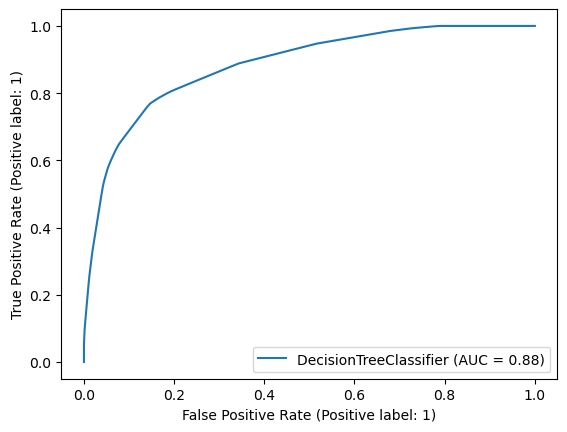

In [235]:
plot_roc_curve(dt_best, x_train, y_train)
plt.show()

# Using Random Forest

In [236]:
from sklearn.ensemble import RandomForestClassifier

In [237]:
rf = RandomForestClassifier(n_estimators = 10, max_depth=4, max_features=5, random_state=100, oob_score=True)

In [238]:
%%time
rf.fit(x_train, y_train)

Wall time: 684 ms


RandomForestClassifier(max_depth=4, max_features=5, n_estimators=10,
                       oob_score=True, random_state=100)

In [239]:
rf.oob_score_

0.7726438188494492

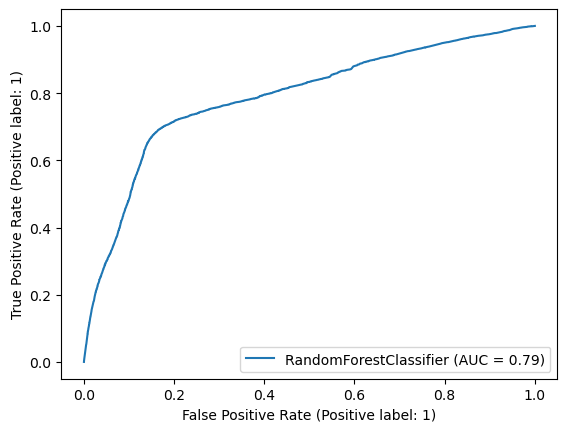

In [240]:
plot_roc_curve(rf, x_train, y_train)
plt.show()

### Hyper-parameter tuning for the Random Forest

In [241]:
rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [242]:
params = {
    'max_depth': [2,3,5,10,20],
    'min_samples_leaf': [5,10,20,50,100,200],
    'n_estimators': [10, 25, 50, 100]
}

In [243]:
grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

In [244]:
%%time
grid_search.fit(x_train, y_train)

Fitting 4 folds for each of 120 candidates, totalling 480 fits
Wall time: 4min 31s


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200],
                         'n_estimators': [10, 25, 50, 100]},
             scoring='accuracy', verbose=1)

In [245]:
grid_search.best_score_

0.846140605875153

In [246]:
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_estimators=50,
                       n_jobs=-1, random_state=42)

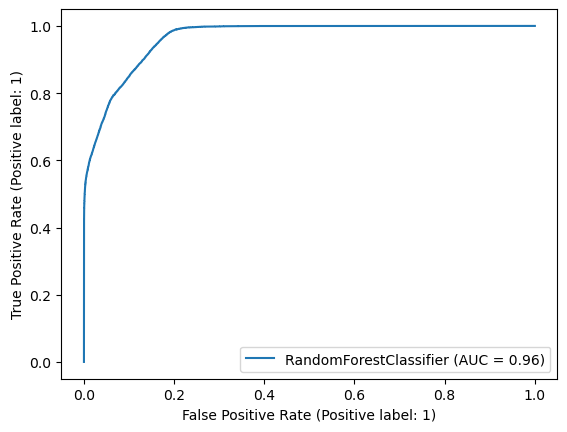

In [247]:
plot_roc_curve(rf_best, x_train, y_train)
plt.show()

In [248]:
rf_best.feature_importances_

array([0.03033474, 0.04353183, 0.0355482 , 0.05383567, 0.1313808 ,
       0.10570414, 0.064293  , 0.07346073, 0.24240005, 0.02580345,
       0.0397587 , 0.02814939, 0.03643455, 0.00264719, 0.00204061,
       0.00259926, 0.00262324, 0.00183316, 0.00225247, 0.00168135,
       0.00158329, 0.00132691, 0.00134891, 0.00149225, 0.00178433,
       0.00149744, 0.00141582, 0.00141183, 0.00159489, 0.00163044,
       0.00151054, 0.0015492 , 0.00135736, 0.00121008, 0.00166568,
       0.00940778, 0.01346422, 0.00508006, 0.00969894, 0.00237017,
       0.00172286, 0.00134199, 0.00232314, 0.00473493, 0.00116443])

In [249]:
imp_df = pd.DataFrame({
    "Varname": x_train.columns,
    "Imp": rf_best.feature_importances_
})

In [250]:
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
8,Outstanding_Debt,0.242400
4,Interest_Rate,0.131381
5,Delay_from_due_date,0.105704
7,Num_Credit_Inquiries,0.073461
6,Changed_Credit_Limit,0.064293
3,Num_Credit_Card,0.053836
1,Annual_Income,0.043532
10,Total_EMI_per_month,0.039759
12,Monthly_Balance,0.036435
2,Monthly_Inhand_Salary,0.035548
